# LightDark Demo

In [4]:
importall POMDPs
using POMDPToolbox
using Distributions
using Parameters
using Plots
using StaticArrays

# Problem Definition

In [5]:
@with_kw struct SimpleLightDark <: POMDPs.POMDP{Int,Int,Float64}
    discount::Float64       = 0.95
    correct_r::Float64      = 100.0
    incorrect_r::Float64    = -100.0
    light_loc::Int          = 10
    radius::Int             = 60
end
discount(p::SimpleLightDark) = p.discount
isterminal(p::SimpleLightDark, s::Number) = !(s in -p.radius:p.radius)

const ACTIONS = [-10, -1, 0, 1, 10]
actions(p::SimpleLightDark) = ACTIONS
n_actions(p::SimpleLightDark) = length(actions(p))
const ACTION_INDS = Dict(a=>i for (i,a) in enumerate(actions(SimpleLightDark())))
action_index(p::SimpleLightDark, a::Int) = ACTION_INDS[a]

states(p::SimpleLightDark) = -p.radius:p.radius + 1
n_states(p::SimpleLightDark) = length(states(p))
state_index(p::SimpleLightDark, s::Int) = s+p.radius+1

function transition(p::SimpleLightDark, s::Int, a::Int) 
    if a == 0
        return SparseCat(SVector(p.radius+1), SVector(1.0))
    else
        return SparseCat(SVector(clamp(s+a, -p.radius, p.radius)), SVector(1.0))
    end
end

observation(p::SimpleLightDark, sp) = Normal(sp, abs(sp - p.light_loc) + 0.0001)

function reward(p::SimpleLightDark, s, a)
    if a == 0
        return s == 0 ? p.correct_r : p.incorrect_r
    else
        return -1.0
    end
end

function initial_state_distribution(p::SimpleLightDark)
    ps = ones(2*div(p.radius,2)+1)
    ps /= length(ps)
    return SparseCat(div(-p.radius,2):div(p.radius,2), ps)
end;

# Visualization

In [6]:
using Plots

function plothist(pomdp, hist, heading="LightDark")
    tmax = 80
    smin = -10
    smax = 20
    vsh = collect(filter(s->!isterminal(pomdp,s), state_hist(hist)[1:end-1]))
    bh = belief_hist(hist)

    pts = Int[]
    pss = Int[]
    pws = Float64[]

    for t in 0:length(bh)-1
        b = bh[t+1]
        for s in smin:smax
            w = 10.0*sqrt(pdf(b, s))
            if 0.0<w<1.0
                w = 1.0
            end
            push!(pts, t)
            push!(pss, s)
            push!(pws, w)
        end
    end

    T = linspace(0.0, tmax)
    S = linspace(-1.0, 21.0)
    inv_grays = cgrad([RGB(1.0, 1.0, 1.0),RGB(0.0,0.0,0.0)])
    p = contour(T, S, (t,s)->abs(s-pomdp.light_loc),
            bg_inside=:black,
            fill=true,
            xlim=(0, tmax),
            ylim=(smin, smax),
            color=inv_grays,
            xlabel="Time",
            ylabel="State",
            cbar=false,
            legend=:topright,
            title=@sprintf("%s (Reward: %8.2f)", heading, discounted_reward(hist))
           )
    plot!(p, [0, tmax], [0, 0], linewidth=1, color="green", label="Goal", line=:dash)
    scatter!(p, pts, pss, color="lightblue", label="Belief Particles", markersize=pws, marker=stroke(0.1, 0.3))
    plot!(p, 0:length(vsh)-1, vsh, linewidth=3, color="orangered", label="Trajectory")
    return p
end;

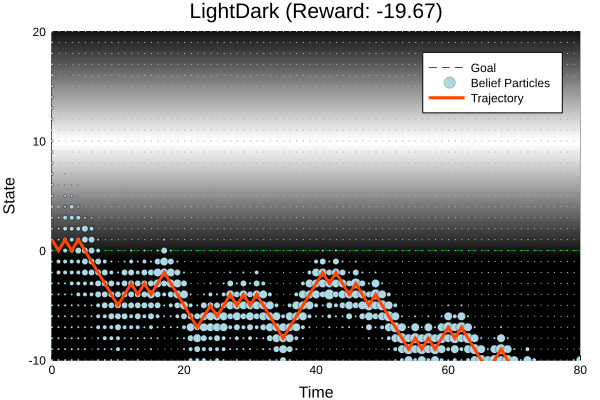

In [8]:
using ParticleFilters
rng = MersenneTwister(7)

p = SimpleLightDark()
pf = SIRParticleFilter(p, 10000, rng=rng)

h = sim(p, updater=pf, initial_state=1, initial_obs=initial_state_distribution(p), max_steps=80, rng=rng) do b
    return rand(rng, [-1,1])
end

plothist(p, h)

In [9]:
using QMDP

solver = QMDPSolver()

policy = solve(solver, p, verbose=true);

[Iteration 1   ] residual:        100 | iteration runtime:      0.094 ms, (  9.36E-05 s total)
[Iteration 2   ] residual:         95 | iteration runtime:      0.038 ms, (  0.000132 s total)
[Iteration 3   ] residual:       90.3 | iteration runtime:      0.027 ms, (  0.000158 s total)
[Iteration 4   ] residual:       85.7 | iteration runtime:      0.026 ms, (  0.000184 s total)
[Iteration 5   ] residual:       81.5 | iteration runtime:      0.026 ms, (   0.00021 s total)
[Iteration 6   ] residual:       77.4 | iteration runtime:      0.026 ms, (  0.000236 s total)
[Iteration 7   ] residual:       73.5 | iteration runtime:      0.026 ms, (  0.000262 s total)
[Iteration 8   ] residual:       8.17 | iteration runtime:      0.026 ms, (  0.000288 s total)
[Iteration 9   ] residual:       3.98 | iteration runtime:      0.026 ms, (  0.000315 s total)
[Iteration 10  ] residual:          0 | iteration runtime:      0.026 ms, (   0.00034 s total)


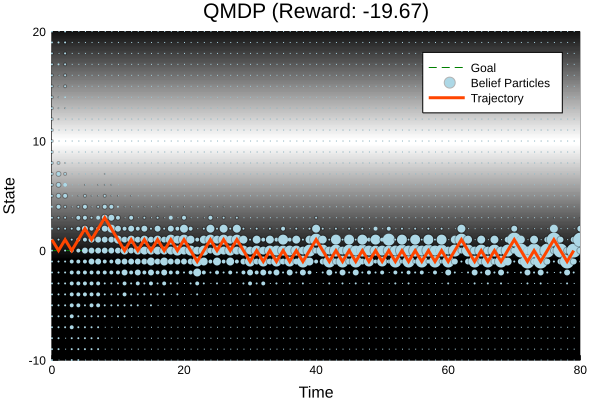

In [10]:
srand(rng, 14)
hr = HistoryRecorder(max_steps=80, initial_state=1)
h = simulate(hr, p, policy, pf)
plothist(p, h, "QMDP")

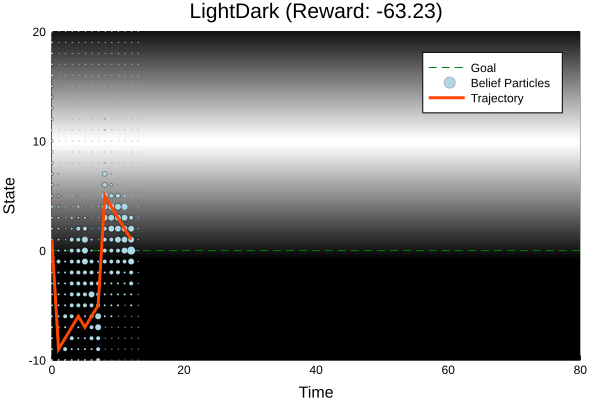

In [11]:
using BasicPOMCP
using DiscreteValueIteration
srand(rng, 7)
max_depth = 20
max_time = 0.01
ro = ValueIterationSolver()
sol = POMCPSolver(max_depth=max_depth,
            max_time=max_time,
            c=100.0,
            tree_queries=typemax(Int),
            # estimate_value=FOValue(ro),
            estimate_value=FORollout(RandomSolver()),
            rng=rng,
            tree_in_info=true
           )

planner = solve(sol, p)
h = simulate(hr, p, planner, pf)
plothist(p, h)

In [12]:
using D3Trees
b = initial_state_distribution(p)
a, i = action_info(planner, b)
D3Tree(i[:tree])

o: <root>
N: 3667      
├──a: -10
│  N: 801     V: -80.7     
│  ├──o: -14.396265671141453
│  │  N: 0         
│  │  ├──a: -10
│  │  │  N: 0       V: 0          (0 children)
│  │  ├──a: -1
│  │  │  N: 0       V: 0          (0 children)
│  │  ├──a: 0
│  │  │  N: 0       V: 0          (0 children)
│  │  ├──a: 1
│  │  │  N: 0       V: 0          (0 children)
│  │  └──a: 10
│  │     N: 0       V: 0          (0 children)
│  ├──o: -10.17057564165357
│  │  N: 0         
│  │  ├──a: -10
│  │  │  N: 0       V: 0          (0 children)
│  │  ├──a: -1
│  │  │  N: 0       V: 0          (0 children)
│  │  ├──a: 0
│  │  │  N: 0       V: 0          (0 children)
│  │  ├──a: 1
│  │  │  N: 0       V: 0          (0 children)
│  │  └──a: 10
│  │     N: 0       V: 0          (0 children)
│  ├──o: 13.399659710292354
│  │  N: 0         
│  │  ├──a: -10
│  │  │  N: 0       V: 0          (0 children)
│  │  ├──a: -1
│  │  │  N: 0       V: 0          (0 children)
│  │  ├──a: 0
│  │  │  N: 0       V: 0          (0 children)
│  │  ├──a: 1
│  │  │  N: 0       V: 0          (0 children)
│  │  └──a: 10
│  │     N: 0       V: 0          (0 children)
│  ├──o: -41.53172380624389
│  │  N: 0         
│  │  ├──a: -10
│  │  │  N: 0       V: 0          (0 children)
│  │  ├──a: -1
│  │  │  N: 0       V: 0          (0 children)
│  │  ├──a: 0
│  │  │  N: 0       V: 0          (0 children)
│  │  ├──a: 1
│  │  │  N: 0       V: 0          (0 children)
│  │  └──a: 10
│  │     N: 0       V: 0          (0 children)
│  ├──o: -20.878687352088196
│  │  N: 0         
│  │  ├──a: -10
│  │  │  N: 0       V: 0          (0 children)
│  │  ├──a: -1
│  │  │  N: 0       V: 0          (0 children)
│  │  ├──a: 0
│  │  │  N: 0       V: 0          (0 children)
│  │  ├──a: 1
│  │  │  N: 0       V: 0          (0 children)
│  │  └──a: 10
│  │     N: 0       V: 0          (0 children)
│  ├──o: 6.112298020769618
│  │  N: 0         
│  │  ├──a: -10
│  │  │  N: 0       V: 0          (0 children)
│  │  ├──a: -1
│  │  │  N: 0       V: 0          (0 children)
│  │  ├──a: 0
│  │  │  N: 0       V: 0          (0 children)
│  │  ├──a: 1
│  │  │  N: 0       V: 0          (0 children)
│  │  └──a: 10
│  │     N: 0       V: 0          (0 children)
│  ├──o: 38.21718910978877
│  │  N: 0         
│  │  ├──a: -10
│  │  │  N: 0       V: 0          (0 children)
│  │  ├──a: -1
│  │  │  N: 0       V: 0          (0 children)
│  │  ├──a: 0
│  │  │  N: 0       V: 0          (0 children)
│  │  ├──a: 1
│  │  │  N: 0       V: 0          (0 children)
│  │  └──a: 10
│  │     N: 0       V: 0          (0 children)
│  ├──o: 2.189451965920158
│  │  N: 0         
│  │  ├──a: -10
│  │  │  N: 0       V: 0          (0 children)
│  │  ├──a: -1
│  │  │  N: 0       V: 0          (0 children)
│  │  ├──a: 0
│  │  │  N: 0       V: 0          (0 children)
│  │  ├──a: 1
│  │  │  N: 0       V: 0          (0 children)
│  │  └──a: 10
│  │     N: 0       V: 0          (0 children)
│  ├──o: -115.62942478640176
│  │  N: 0         
│  │  ├──a: -10
│  │  │  N: 0       V: 0          (0 children)
│  │  ├──a: -1
│  │  │  N: 0       V: 0          (0 children)
│  │  ├──a: 0
│  │  │  N: 0       V: 0          (0 children)
│  │  ├──a: 1
│  │  │  N: 0       V: 0          (0 children)
│  │  └──a: 10
│  │     N: 0       V: 0          (0 children)
│  ├──o: 0.14207540499794824
│  │  N: 0         
│  │  ├──a: -10
│  │  │  N: 0       V: 0          (0 children)
│  │  ├──a: -1
│  │  │  N: 0       V: 0          (0 children)
│  │  ├──a: 0
│  │  │  N: 0       V: 0          (0 children)
│  │  ├──a: 1
│  │  │  N: 0       V: 0          (0 children)
│  │  └──a: 10
│  │     N: 0       V: 0          (0 children)
│  ├──o: -27.49255629840856
│  │  N: 0         
│  │  ├──a: -10
│  │  │  N: 0       V: 0          (0 children)
│  │  ├──a: -1
│  │  │  N: 0       V: 0          (0 children)
│  │  ├──a: 0
│  │  │  N: 0       V: 0          (0 children)
│  │  ├──a: 1
│  │  │  N: 0       V: 0          (0 children)
│  │  └──a: 10
│  │     N: 0       V: 0          (0 children)
│  ├──o: 9

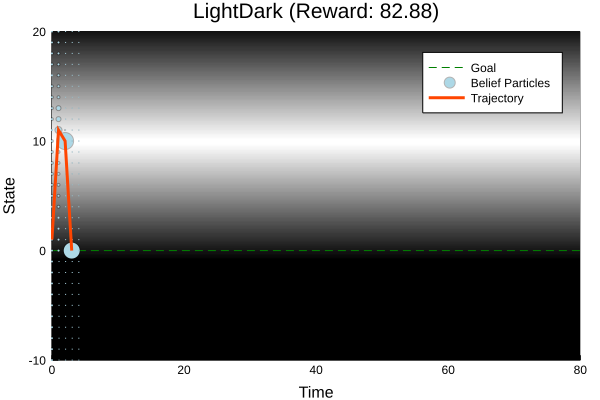

In [13]:
using POMCPOW
srand(rng, 7)
max_time=0.01
sol = POMCPOWSolver(tree_queries=10_000_000,
                       criterion=MaxUCB(90.0),
                       max_depth=max_depth,
                       max_time=max_time,
                       enable_action_pw=false,
                       k_observation=5.0,
                       alpha_observation=1/15.0,
                       # estimate_value=FOValue(ro),
                       estimate_value=FORollout(RandomSolver()),
                       check_repeat_obs=false,
                       tree_in_info=true,
                       rng=rng
                      )

planner = solve(sol, p)
h = simulate(hr, p, planner, pf)
plothist(p, h)

In [14]:
using D3Trees
b = initial_state_distribution(p)
a, i = action_info(planner, b)
D3Tree(i[:tree])

o: <root>
N: 2592      

├──a: -10
│  N: 636     V: -78.7     
│  ├──o: 10.467709838868478
│  │  N: 69        

│  │  ├──a: -10
│  │  │  N: 16      V: -82.8      (6 children)
│  │  ├──a: -1
│  │  │  N: 15      V: -85        (6 children)
│  │  ├──a: 0
│  │  │  N: 9       V: -100       (6 children)
│  │  ├──a: 1
│  │  │  N: 13      V: -88        (6 children)
│  │  └──a: 10
│  │     N: 16      V: -84.1      (6 children)
│  ├──o: -33.441116783070555
│  │  N: 86        

│  │  ├──a: -10
│  │  │  N: 19      V: -81.6      (7 children)
│  │  ├──a: -1
│  │  │  N: 18      V: -82.5      (7 children)
│  │  ├──a: 0
│  │  │  N: 10      V: -100       (6 children)
│  │  ├──a: 1
│  │  │  N: 16      V: -84.6      (6 children)
│  │  └──a: 10
│  │     N: 23      V: -77        (7 children)
│  ├──o: -51.853672112047896
│  │  N: 91        

│  │  ├──a: -10
│  │  │  N: 24      V: -79.1      (7 children)
│  │  ├──a: -1
│  │  │  N: 19      V: -82.7      (7 children)
│  │  ├──a: 0
│  │  │  N: 10      V: -100       (6 children)
│  │  ├──a: 1
│  │  │  N: 17      V: -87.1      (7 children)
│  │  └──a: 10
│  │     N: 21      V: -81.7      (7 children)
│  ├──o: -14.55004839184031
│  │  N: 79        

│  │  ├──a: -10
│  │  │  N: 13      V: -76.3      (6 children)
│  │  ├──a: -1
│  │  │  N: 15      V: -73.1      (6 children)
│  │  ├──a: 0
│  │  │  N: 15      V: -73.3      (6 children)
│  │  ├──a: 1
│  │  │  N: 15      V: -73.8      (6 children)
│  │  └──a: 10
│  │     N: 21      V: -65.8      (7 children)
│  ├──o: -16.72844639213738
│  │  N: 75        

│  │  ├──a: -10
│  │  │  N: 18      V: -76.7      (7 children)
│  │  ├──a: -1
│  │  │  N: 16      V: -78.8      (6 children)
│  │  ├──a: 0
│  │  │  N: 8       V: -100       (6 children)
│  │  ├──a: 1
│  │  │  N: 18      V: -75.3      (7 children)
│  │  └──a: 10
│  │     N: 15      V: -81.2      (6 children)
│  ├──o: -77.18749556333506
│  │  N: 80        

│  │  ├──a: -10
│  │  │  N: 17      V: -84.5      (7 children)
│  │  ├──a: -1
│  │  │  N: 18      V: -82.2      (7 children)
│  │  ├──a: 0
│  │  │  N: 10      V: -100       (6 children)
│  │  ├──a: 1
│  │  │  N: 15      V: -86.6      (6 children)
│  │  └──a: 10
│  │     N: 20      V: -81        (7 children)
│  ├──o: -3.6165208579293733
│  │  N: 87        

│  │  ├──a: -10
│  │  │  N: 18      V: -81.4      (7 children)
│  │  ├──a: -1
│  │  │  N: 26      V: -75        (7 children)
│  │  ├──a: 0
│  │  │  N: 9       V: -100       (6 children)
│  │  ├──a: 1
│  │  │  N: 18      V: -81.2      (7 children)
│  │  └──a: 10
│  │     N: 16      V: -85.1      (6 children)
│  └──o: -10.243325780663284
│     N: 61        

│     ├──a: -10
│     │  N: 15      V: -78        (6 children)
│     ├──a: -1
│     │  N: 13      V: -82.8      (6 children)
│     ├──a: 0
│     │  N: 7       V: -100       (6 children)
│     ├──a: 1
│     │  N: 14      V: -78.9      (6 children)
│     └──a: 10
│        N: 12      V: -83        (6 children)
├──a: -1
│  N: 545     V: -79.6     
│  ├──o: 54.91914191726154
│  │  N: 74        

│  │  ├──a: -10
│  │  │  N: 16      V: -86.6      (6 children)
│  │  ├──a: -1
│  │  │  N: 18      V: -82.9      (7 children)
│  │  ├──a: 0
│  │  │  N: 9       V: -100       (6 children)
│  │  ├──a: 1
│  │  │  N: 15      V: -88        (6 children)
│  │  └──a: 10
│  │     N: 16      V: -85        (6 children)
│  ├──o: -46.054185453521455
│  │  N: 66        

│  │  ├──a: -10
│  │  │  N: 10      V: -89.3      (6 children)
│  │  ├──a: -1
│  │  │  N: 15      V: -79.3      (6 children)
│  │  ├──a: 0
│  │  │  N: 8       V: -100       (6 children)
│  │  ├──a: 1
│  │  │  N: 14      V: -80.6      (6 children)
│  │  └──a: 10
│  │     N: 19      V: -73        (7 children)
│  ├──o: -64.5126709855841
│  │  N: 59        

│  │  ├──a: -10
│  │  │  N: 15      V: -80.2      (6 children)
│  │  ├──a: -1
│  │  │  N: 12      V: -85.8      (6 children)
│  │  ├──a: 0
│  │  │  N: 8       V: -100       (6 children)
│  │  ├──a: 1
│  │  │  N: 13      V: -82.7      (6 children)
│  │  └──a: 10
│  │  